#### **Примечание**

Обучение и инференс модели были произведены на kaggle.com

#### Установка необходимых модулей в Kaggle:

In [4]:
pip install pytorch_metric_learning

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install faiss-gpu

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install pytorch_lightning

Note: you may need to restart the kernel to use updated packages.


#### Импортируем необходимые модули:

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import json
import scipy.io
import time

import torch
import torchvision
from torch.utils.data import DataLoader, Dataset, Subset, ConcatDataset, random_split
import torch.nn as nn
from torch.optim import Adadelta, Adam
from torch.optim.lr_scheduler import StepLR
from torch.utils.tensorboard import summary, writer, SummaryWriter
from torchvision.datasets import ImageFolder
import torchmetrics
from IPython.display import display
from ipywidgets import IntProgress


from torchvision import transforms
from torchvision.models import resnet18
import torch.functional as F

from PIL import Image 
from tqdm import tqdm
import cv2

from pytorch_metric_learning.losses import TripletMarginLoss
from pytorch_metric_learning.miners import BatchEasyHardMiner, TripletMarginMiner
from pytorch_metric_learning import distances, losses, miners, reducers, testers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
import pytorch_lightning as pl
import faiss
from pytorch_metric_learning.utils.inference import CustomKNN
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger, CSVLogger

In [8]:
progress_bar = IntProgress(min=0, max=100, description='Обучение модели:')
display(progress_bar)

IntProgress(value=0, description='Обучение модели:')

#### Устанавливаем SEED:

In [9]:
# Устанавливаем Seed
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

import warnings
warnings.filterwarnings("ignore")

#### В данном ноутбуке нейростеть для metric learning обучается при функции потерь ***ArcFaceLoss***:

#### В данной ячейке объявляется функция отрисовки изображения:

In [1]:
def plot_image(image, label):
	'''
	Вспомогательная функция для plotting'а тензора torch
	
	Параметры:
	-image: TorchTensor
	-label: str для написания заголовка
	'''
	img = image.squeeze(0).permute(1, 2, 0).numpy()
	fig = plt.figure(figsize = (4, 4))
	plt.imshow(img)
	plt.title(label)
	plt.tight_layout()
	plt.axis('off')

#### ¡Here we go!

#### Здесь объявляются torchvision.transforms для базового и аугментационного преобразования. Дополнительно используется функция денормализации изображения, чтобы корректно его вывести через plot_image()

In [4]:
# Базовый transform
base_transform = transforms.Compose(
    [
        transforms.Resize((300, 300)),
        transforms.ToTensor(),
        transforms.CenterCrop(276),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

# Transform для аугментаций 
base_augmentation = transforms.Compose(
    [
        transforms.Resize((300, 300)),
        transforms.RandomCrop((276, 276)),
        transforms.ToTensor(), 
        transforms.RandomHorizontalFlip(p=1),
        transforms.ColorJitter(
            brightness=[0.85, 1.5], 
            contrast=[0.8, 1.5],
            hue = [0, 0.225]
            ),
        transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Денормализация изображения для вывода через plt.imhsow()
def unnormalize(tensor, mean=mean, std=std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor


#### Класс CarsDataset:

In [5]:
class CarsDataset(Dataset):

        '''
        Простой класс датасета для получения изображений и меток. 

        Функции:
        def __init__(self, ...):
        Параметры:
        -path: путь к изображениям
        -test_flag (Bool): флаг, который сигнализирует тест. Необходим для простого получения тестовых изображений
        -labels (list): метки изображений
        -image_names (list): названия изображений (.jpg)
        -transform: torchvision transform для изображения

        def __len__(self):
        Возвращает длину датасета

        def __getitem__(self, idx):
        Возвращает изображение-метку по индексу в датасете

        '''

        def __init__(self, path, labels, test_flag = False, transform = None):
            self.test_flag = test_flag
            self.path = path
            self.labels = list(labels.values())
            self.image_names = list(labels.keys())
            if transform is not None:
                self.transform = transform

        def __len__(self):
            return len(self.labels)

        def __getitem__(self, idx):

            image_path = self.image_names[idx]
            image_path = os.path.join(self.path, image_path)
            image = Image.open(image_path).convert('RGB')

            if self.transform is not None:
                image = self.transform(image)

            if not self.test_flag:
                image_label = self.labels[idx]
                return image, image_label
            else:
                return image





#### Класс CarsDatasetTriplets. 

#### !!!***Не использовался***!!! при генерации датасета и обучении, просто использовал на другом ноутбуке для отрисовки троек positive, negative, anchor.

In [6]:
class CarsDatasetTriplets(Dataset):

    '''
    Класс датасета для применения TripletLoss. Класс применяется для получения по индексу anchor и positive изображений

    def __init__(self):
    non-self Параметры:
    -path - путь к директории
    -labels - словарь label_to_name
    -test_flag - флаг, для получения тестового датасета (просто предобработанные картинки для классификации): False по умолчанию
    -transform - torchvision трансформация изображения

    def get_samples_indices_by_label(self)
    -Позволяет получить индексы по label anchor изображения. Нужен для выбора индекса positive изображения

    def __len__(self)
    -Получить длину датасета

    def __getitem__(self, idx):
    -По параметру idx возвращает пару изображений (anchor + positive) и общий label для них. 
    -Если flag_test = True, то только изображние

    P.S. На момент написания этой логики, я еще не знал о существовании pytorch_metric_learning.miners, который вроде как может
    реализовать триплетный подход из коробки, но оставим эту реализацию на случай ручного использования

    '''
    def __init__(self, path, labels, test_flag = False, transform = None):
        self.test_flag = test_flag
        self.path = path
        self.labels = list(labels.values())
        self.image_names = list(labels.keys())
        if transform is not None:
            self.transform = transform

        self.label_to_indices = self.get_samples_indices_by_label()


    def get_samples_indices_by_label(self):
        label_to_indices = {}
        for i, label in enumerate(self.labels):
            if label not in label_to_indices:
                label_to_indices[label] = []
            label_to_indices[label].append(i)
        return label_to_indices

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image_anchor_path = self.image_names[idx]
        image_anchor_path = os.path.join(self.path, image_anchor_path)
        image_anchor = Image.open(image_anchor_path).convert('RGB')

        if self.transform is not None:
            image_anchor = self.transform(image_anchor)

        if not self.test_flag:
            image_label = self.labels[idx]
            positive_indices = [i for i in self.label_to_indices[image_label] if i != idx]

            index_positive = random.choice(positive_indices)
            image_positive_path = self.image_names[index_positive]
            image_positive_path = os.path.join(self.path, image_positive_path)
            image_positive = Image.open(image_positive_path).convert('RGB')

            if self.transform is not None:
                image_positive = self.transform(image_positive)

            return image_anchor, image_positive, image_label
        else:
            return image_anchor



#### Функция для парсинга аннотаций изображений из файла .mat:

In [ ]:
def parse_mat(file_path):

    '''
    Функция для парсинга MATLAB аннотаций

    Параметры:
    -file_path: путь к файлу с аннотациями

    Возвращает:
    загруженный файл
    '''

    mat_data = scipy.io.loadmat(file_path)


    return mat_data

cars_meta = parse_mat('/kaggle/input/cars196/devkit/devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}

#### Функция для получения готовых датасетов (train, val, test):

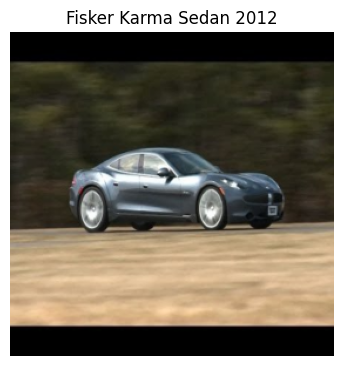

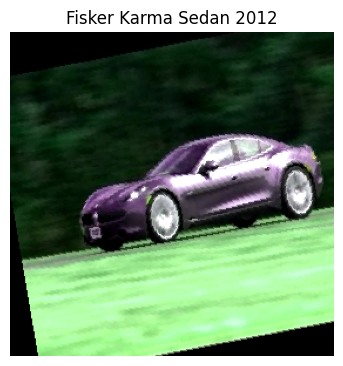

In [ ]:
def get_datasets(
    root_dir = './archive',
    train_dir = '/kaggle/input/cars196/archive/archive/cars_train/cars_train',
    test_dir = '/kaggle/input/cars196/archive/archive/cars_test/cars_test',
    mat_train = '/kaggle/input/cars196/devkit/devkit/cars_train_annos.mat',
    mat_test = '/kaggle/input/cars196/devkit/devkit/cars_test_annos.mat',
    train_size = 0.8,
    transform = base_transform,
    augmentation_flag = True,
    augmentation = base_augmentation,
    visualize_examples = False,
    label_to_name = id_to_car,
    idx_to_visualize = 0,
    dataset_type = CarsDatasetTriplets
    ):

                '''
                -Функция, которая реализует загрузку датасетов.
                -Включает в себя базовую трансформацию и аугментацию (опционально) данных

                Параметры:
                -root_dir: путь к папке (Опционально)
                -train_dir: путь к train папке
                -test_dir: путь к test папке
                -mat_train: путь к разметке train MATLAB
                -mat_test: путь к разметке теста MATLAB
                -train_size (float [0, 1]): Размер тренировочной выборки для сплита (default 0.8) 
                -transform = base_transform: torch transfrom - базовая трансформация данных
                -augmentation_flag (Bool): флаг для применения аугментации к данным (default: True)
                -augmentation = base_augmentation - transform-аугментация данных
                -visualize_examples: Bool - флаг, показывать картинки датасетов или нет
                -label_to_name: Dict - перевод label в строку string (словарь марок авто по умолчанию)
                -idx_to_visualize: int - индекс в датасете для визуализации (по умолчанию 0)
                -dataset_type: тип датасета (default: CarsDatasetTriplets)

                Возвращает:
                кортеж предобработанных датасетов (train, val & test)
                '''

                labels_test = {}

                mat_data_train = parse_mat(mat_train)
                mat_data_test = parse_mat(mat_test)

                samples_test = mat_data_test['annotations'][:][:][-1]

                for sample in samples_test:
                    labels_test[sample[-1][0]] = sample[-2][0][0]

                fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat_data_train['annotations'][0]['fname']], 
                                                [i[0][0] for i in mat_data_train['annotations'][0]['class']])}

				# создаем через конструктор датасет для тренировочного набора без аугментаций
                train_cars_base_dataset = dataset_type(
                    path = train_dir, 
                    labels = fname_to_class,
                    transform = transform
                )

				# создаем через конструктор датасет для тренировочного набора с учетом аугментаций
                if augmentation_flag:
                    train_cars_augmented_dataset = dataset_type(
                        path = train_dir, 
                        labels = fname_to_class,
                        transform = augmentation
                    )

				# создаем через конструктор датасет для тестового набора (метки неизвестны на самом деле)
                test_cars_dataset = dataset_type(
                    path = test_dir, 
                    labels = labels_test,
                    transform = transform, test_flag=True
                )

				# Если требуем визуализацию, то выводим картинки
                if visualize_examples:
                    if dataset_type == CarsDatasetTriplets:

                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][0]), label_to_name[train_cars_base_dataset[idx_to_visualize][2]])
                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][1]), label_to_name[train_cars_base_dataset[idx_to_visualize][2]])

                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][0]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][2]])
                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][1]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][2]])

                    elif dataset_type == CarsDataset:

                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][0]), label_to_name[train_cars_base_dataset[idx_to_visualize][1]])
                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][0]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][1]])

				# Делаем Concat датаестов для train'а
                full_data = ConcatDataset([train_cars_base_dataset, train_cars_augmented_dataset])
                train_size = int(train_size * len(full_data)) 
                val_size = len(full_data) - train_size
                # Split данных на train и val
                train_dataset, validation_dataset = random_split(full_data, [train_size, val_size])


                return train_dataset, validation_dataset, test_cars_dataset


train_dataset, validation_dataset, test_dataset = get_datasets(
                                                        visualize_examples=True,
                                                        idx_to_visualize=101,
                                                        dataset_type=CarsDataset) # CarsDataset

#### Как мы видим, аугментации сработали корректно!	✅

#### Корректные изображения и их аугментации!

#### Контроль размерностей и вывода сэмплов датасета:

In [16]:
train_dataset[0][0].size()

torch.Size([3, 276, 276])

In [17]:
train_dataset[101][0].size(), train_dataset[101][1]

(torch.Size([3, 276, 276]), 113)

#### Выводим количество сэмплов:

In [18]:
print(len(train_dataset))
print(len(test_dataset))

13030
8041


#### Таким образом, аугментации добавили нам дополнительных изображений в датасет.

#### Функция получения dataloader'ов:

In [19]:
def get_dataloaders(
		train_dataset = train_dataset,
		val_dataset = validation_dataset,
		batch_size = 64,
		shuffle_train = True,
		shuffle_test = False
		):
	
	'''
	Функция для получения итераторов dataloader'ов (train_loader и val_loader)
	
	Параметры:
	-train_dataset: датасет train (default: train_dataset)
	-val_dataset: датасет validation (default: validation_dataset)
	-batch_size: размер пакета данных (default: 64)
	-shuffle_train (Bool): фдаг для перемешивания train (default: True)
	-shuffle_test (Bool): фдаг для перемешивания val (default: False)

	Возвращает:
	кортеж итераторов (train_loader, val_loader)

	'''

	train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle_train)
	val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=shuffle_test)

	return train_loader, val_loader

train_loader, val_loader = get_dataloaders(batch_size = 312)

#### Dataloader'ы работают корректно ✅

#### Далее, объявляется класс модели с использованием pytroch_metric_learning, которая и будет обучаться!	✅

In [ ]:
class modelArcFaceLoss(pl.LightningModule):

	'''
	Класс модели с функцией потерь ArcFaceLoss (наследует методы из pl.LightningModule)
	'''

	def __init__(
			self,
			model=resnet18(pretrained=True), # базовая модель resnet18
			embedding_size=128,
			distance_metric=distances.CosineSimilarity(),
			reducer=reducers.ThresholdReducer(low=0),
			loss_fn=losses.ArcFaceLoss,  # Вот она ArcFace из pytorch_metric_learning
			arcface_margin=0.5,  # margin гиперпараметр
			arcface_scale=64,  #scale гиперпараметр
			optimizer=Adam, 
			optimizer_params={'lr': 0.001, 'weight_decay': 0.0001},
			class_dict=id_to_car,
			min_lr=1e-5,
			step_size=8,
			gamma=0.5
			):
		
		'''
		Конуструктор объекта класс def __init__(self, ...)

		Парамеры:
		-model: Базовая модель (default: resnet18(pretrained = True))
		-embedding_size: Размер эмбеддингов после сверточных слоев для решения задачи Metric Learning (default = 128)
		-distance_metric: Метрика подсчета расстояния между объектами (default: CosineSimilarity())
		-reduce: Функция редукции потерь, которая используется для фильтрации значений loss на основе порогового значения.
		Например, ThresholdReducer(low=0) игнорирует все значения потерь ниже 0.
		Это может повысить устойчивость к шуму в данных (default: ThresholdReducer(low=0))
		-loss_fn: функция потерь (default: ArcFaceLoss)
		-arcface_margin: Смещение угла в формуле функции потерь (default: 0.5)
		-arcface_scale: Масшатабирующий параметр в формуле функции потерь (default: 64)
		-optimizer: оптимизатор (default: Adam)
		-optimizer_params: параметры оптимизатора
		-class_dict: словарь Dict label->name
		-min_lr: минимальный шаг сходимости (тот предел, до которого уменьшается lr в процессе обучения)
		-step_size: число эпох, через которое экпоненциально уменьшаем шаг сходимости
		-gamma: уменьшающий множитель 

		Инициализирует всё необходимое

		'''

		super(modelArcFaceLoss, self).__init__()

		# Модель и её параметры (Архитектура + Функция потерь + Оптимизатор)
		self.backbone = model,
		self.backbone = self.backbone[0]
		self.embedding_size = embedding_size
		self.backbone.fc = nn.Linear(self.backbone.fc.in_features, self.embedding_size)
		self.fc = nn.Linear(self.embedding_size, self.embedding_size)
		self.distance = distance_metric
		self.reducer = reducer
		self.arcface_margin = arcface_margin
		self.arcface_scale = arcface_scale
		self.loss_fn = loss_fn(
			num_classes=len(class_dict),
			embedding_size=self.embedding_size,
			margin=self.arcface_margin,
			scale=self.arcface_scale
		)

		self.optimizer_params = optimizer_params
		self.optimizer = optimizer(self.parameters(), **self.optimizer_params)
		self.class_dict = class_dict

		# Если мы хотим еще параллельно решать задачу классификации на основе привычной CrossEntropy
		self.classifier_head = nn.Sequential(
			nn.ReLU(),
			nn.Linear(in_features=self.embedding_size, out_features=len(self.class_dict))
		)
		self.classif_loss = torch.nn.CrossEntropyLoss()
		self.save_hyperparameters()
		self.gamma = gamma
		self.step_size = step_size
		self.scheduler = StepLR(self.optimizer, step_size=self.step_size, gamma=self.gamma)
		self.min_lr = min_lr

		# Эмбеддинги для подсчета метрик в конце валидации
		self.val_embeddings = []
		self.val_labels = []

	def forward(self, input_x):
		'''
		forward модели после подачи batch_size:

		Параметры:
		-self
		-input_x: входой пакет картинок

		Возвращает эмбеддинг картинки
		'''

		# Прогон через CNN
		cnn_output = self.backbone(input_x)
		# Прогон через линейные слои
		embedding = self.fc(cnn_output)
		return embedding

	def training_step(self, batch, batch_idx):
			'''
			Часть train логики: подаем батч, разбиваем на (images, labels)
			Возвращем loss, по которому будет считаться градиент
			'''

			images, labels = batch
			embeddings = self(images)

			# ArcFace loss
			loss_arcface = self.loss_fn(embeddings, labels)
			final_loss = loss_arcface

			self.log('train_loss', final_loss, sync_dist=True)
			return final_loss

	def on_train_start(self):
		self.train()

	def validation_step(self, batch, batch_idx):
			
			'''
			Логика на валидации: подаем батч, считаем loss на валидации и записываем в tensor_board
			И добавляем эмбеддинги и метки для подсчёта метрик
			'''

			images, labels = batch
			embeddings = self(images)

			loss_arcface = self.loss_fn(embeddings, labels)

			final_loss = loss_arcface
			self.log('validation_loss', final_loss, sync_dist=True)

			self.val_embeddings.append(embeddings)
			self.val_labels.append(labels)

	def on_validation_epoch_end(self):
			
			'''
			Логика в конце валидации: считает ключевые метрики на валидации (спойлер - несовсем верно,
			уже после обучения всё так)

			-precision@1, precision@5, recall@1, recall@5
			-Обнуляет массивы эмбеддингов и меток в конце
			'''

			all_embeddings = torch.cat(self.val_embeddings)
			all_labels = torch.cat(self.val_labels)

			accuracy_calculator = AccuracyCalculator(include=("precision_at_1",), k=1, knn_func=CustomKNN(
				distances.CosineSimilarity(), batch_size=64))

			metrics = accuracy_calculator.get_accuracy(all_embeddings, all_labels)
			precision_at_1 = metrics["precision_at_1"]
			self.log('precision_at_1_epoch', precision_at_1, sync_dist=True)

			_, precision_at_5, recall_at_1, recall_at_5 = self.calculate_additional_metrics(all_embeddings, all_labels)
			self.log('precision_at_5_epoch', precision_at_5, sync_dist=True)
			self.log('recall_at_1_epoch', recall_at_1, sync_dist=True)
			self.log('recall_at_5_epoch', recall_at_5, sync_dist=True)

			self.val_embeddings = []
			self.val_labels = []


	def calculate_additional_metrics(self, embeddings, labels):

		'''
		Подсчет дополнительных метрик (precision@1 работает из коробки)

		-Используется CustomKNN() для как бы эмбеддингов и внутри них (по-хорошему train бы подавать и по нему оценивать точность)

		Вернет кортеж (precision@1, precision@5, recall@1, recall@5)

		'''

		knn = CustomKNN(distances.CosineSimilarity(), batch_size=64)
		_, knn_labels_1 = knn(embeddings, 2, embeddings)
		_, knn_labels_5 = knn(embeddings, 6, embeddings)

		precision_at_1 = []
		recall_at_1 = []
		precision_at_5 = []
		recall_at_5 = []

		for i in range(len(knn_labels_1)):

			reference_index_1 = knn_labels_1[i][1].item()  # первый ближайший сосед (не сам объект)
			reference_index_5 = knn_labels_5[i][1:6].tolist()  # следующие 5 соседей

			reference_labels_1 = labels[reference_index_1] if reference_index_1 < len(labels) else None
			reference_labels_5 = labels[reference_index_5] if all(idx < len(labels) for idx in reference_index_5) else None

			relevant_labels = [labels[i]]

			if reference_labels_1 is not None:
				num_correct_1 = 1 if reference_labels_1==relevant_labels[0] else 0
				precision_at_1.append(num_correct_1 / 1)  # Precision@1
				recall_at_1.append(num_correct_1 / len(relevant_labels) if relevant_labels else 0)  # Recall@1

			if reference_labels_5 is not None:
				num_correct_5 = sum(1 for label in reference_labels_5 if label in relevant_labels)
				precision_at_5.append(num_correct_5 / 5)  # Precision@5
				recall_at_5.append(num_correct_5 / len(relevant_labels) if relevant_labels else 0)  # Recall@5

		precision_at_1 = sum(precision_at_1) / len(precision_at_1) if precision_at_1 else 0
		recall_at_1 = sum(recall_at_1) / len(recall_at_1) if recall_at_1 else 0
		precision_at_5 = sum(precision_at_5) / len(precision_at_5) if precision_at_5 else 0
		recall_at_5 = sum(recall_at_5) / len(recall_at_5) if recall_at_5 else 0

		return precision_at_1, recall_at_1, precision_at_5, recall_at_5


	def on_validation_start(self):
			self.eval()

	def configure_optimizers(self):
		'''
		Объявление оптимизатора и его фичей
		'''
		
		return {
			'optimizer': self.optimizer,
			'lr_scheduler': {
				'scheduler': self.scheduler,
				'interval': 'epoch',
				'frequency': 1,
				'reduce_on_plateau': False,
				'monitor': 'validation_loss',
			}
		}

	def lr_scheduler_step(self, scheduler, metric):
		'''
		Обновление шага сходимости
		'''

		scheduler.step()
		self._adjust_learning_rate()

	def _adjust_learning_rate(self):
		'''
		Проверка достижения предела learning_rate (self.min_lr)
		'''
		
		for param_group in self.optimizer.param_groups:
			param_group['lr'] = max(param_group['lr'], self.min_lr)



#### Класс объявлен. В следующей ячейке инициализируется модель и её параметры:	✅

In [ ]:
'''
Блок инициализации модели и её фичей
'''

'''Объявляем device (на kaggle 'gpu')'''
device = 'gpu' if torch.cuda.is_available() else 'cpu'
print(device)

'''Инициализируем модель. Через 15 (step_size = 15) эпох уменьшаем learning_rate'''
model = modelArcFaceLoss(step_size=15)
pl_model = model

'''
Полезные утилиты:

-early_stopping: обрываем обучение, если loss на валидации не падает в течение 5 эпох
-lr_monitor: мониторинг шага сходимости (чтобы его тоже логировать в TensorBoard)
'''
early_stopping = EarlyStopping(monitor="validation_loss", mode="min", patience=5)
lr_monitor = LearningRateMonitor(logging_interval='step')


'''
Логирование по качеству в TensorBoard:

-checkpoint_callback_1: сохранять Топ-3 по лоссу на валидации
-checkpoint_callback_2: сохранять Топ-2 по метрике precision_at_1
'''
tensorboard_logger = TensorBoardLogger("tb_logs", name="cars196_model_arcface_lr_scheduler_70")
checkpoint_callback_1 = ModelCheckpoint(
    monitor='validation_loss',  
    mode='min', 
    save_top_k=3, 
    filename='best-checkpoint-arcfaceloss-{epoch:02d}-{validation_loss:.2f}'  
)

checkpoint_callback_2 = ModelCheckpoint(
    monitor='precision_at_1_epoch',  
    mode='max', 
    save_top_k=2,  
    filename='best-precision-arcfaceloss-{epoch:02d}-{precision_at_1_epoch:.2f}'  
)

'''
PyTorchLightning Module:

Ключевые параметры:
-max_epochs = 100: Максимум 100 эпох будем обучать
-min_epochs = 70: Минимум 70 эпох будем обучать
'''

trainer = pl.Trainer(
    max_epochs=100,
    min_epochs = 70,
    accelerator=device,
    devices=1,
    logger=tensorboard_logger,
    callbacks=[checkpoint_callback_1, checkpoint_callback_2, early_stopping, lr_monitor],
    log_every_n_steps=1,  
    enable_progress_bar=True  
)



#### Здесь происходит обучение:	✅

In [ ]:
'''Блок обучения'''
trainer.fit(pl_model, train_loader, val_loader)

#### Логи обучения модели в TensorBoard:

#### Train loss:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/interpretation_metric_learning/submit_folder/logs_arcface/train_loss_arcface.png" alt="alt text" width="600"/>

#### Val loss:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/interpretation_metric_learning/submit_folder/logs_arcface/val_loss_arcface.png" alt="alt text" width="600"/>

#### Далее загружаем лучшие по loss и precision модели:

In [24]:
'''Импорт модели и валидация (best_precision)'''
# model_best_precision_arcface = modelArcFaceLoss.load_from_checkpoint('/kaggle/input/arcface_models/pytorch/arcfac_best_models_70_epochs/1/best-precision-arcfaceloss-epoch62-precision_at_1_epoch0.87.ckpt')

# trainer_best_precision = pl.Trainer()
# trainer_best_precision.validate(model_best_precision, val_loader)

#### Самый низкий loss:

In [29]:
'''Импорт модели и валидация (best_val_loss)'''
model_best_loss_arcface = modelArcFaceLoss.load_from_checkpoint('/kaggle/input/arcface_models/pytorch/arcfac_best_models_70_epochs/1/best-checkpoint-arcfaceloss-epoch69-validation_loss0.45.ckpt')
trainer_best_loss = pl.Trainer()
trainer_best_loss.validate(model_best_loss_arcface, val_loader)

Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│   precision_at_1_epoch    │    0.8683241009712219     │
│   precision_at_5_epoch    │    0.8686310648918152     │
│     recall_at_1_epoch     │    0.7903007864952087     │
│     recall_at_5_epoch     │    3.9515039920806885     │
│      validation_loss      │    0.4362313151359558     │
└───────────────────────────┴───────────────────────────┘

[{'validation_loss': 0.4362313151359558,
  'precision_at_1_epoch': 0.8683241009712219,
  'precision_at_5_epoch': 0.8686310648918152,
  'recall_at_1_epoch': 0.7903007864952087,
  'recall_at_5_epoch': 3.9515039920806885}]

In [ ]:
model_best_loss_arcface.eval()
model_best_loss_arcface.to('cuda')
np.float32

#### Функция получения эмбеддингов и меток:

In [33]:
device = 'cuda'
def get_embeds(model, loader):
	
	'''
	Функция получения эмбеддингов и меток для train и val, для train еще и картинок

	Параметры:
	-model: модель
	-loader: итератор (train_loader/val_loader)

	Возвращает кортеж (эмбеддинги, метки и тензоры (картинки))
	'''
	model.to(device)
	embeddings = np.empty((1, 128))
	imgs_list = []
	labels = np.empty((1))
	for batch in tqdm(loader):
		imgs, label = batch
		imgs = imgs.to(device)
		with torch.no_grad():
			preds = model(imgs)
		
		embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
		labels = np.concatenate([labels, label.numpy()])
		imgs_list.append(imgs.cpu())
	return embeddings[1:].astype(np.float32), labels[1:], torch.cat(imgs_list, dim=0)

train_emb, train_labels, images_train = get_embeds(model_best_loss_arcface, train_loader)
val_emb, val_labels, _ = get_embeds(model_best_loss_arcface, val_loader)

100%|██████████| 11/11 [01:08<00:00,  6.19s/it]


In [34]:
train_emb.shape, val_emb.shape, train_labels.shape

((13030, 128), (3258, 128), (13030,))

In [35]:
images_train.size()

torch.Size([13030, 3, 276, 276])

#### Класс UpdDatasetNew:

In [43]:
class UpdDatasetNew(Dataset):
    
    '''
    Класс датасета для трейнов 
    *** чтобы правильные метки были, исходный передавать нельзя из-за shuffle'ов и так далее ***
    '''
    
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels.astype('int')

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]
    
upd_train_dataset = UpdDatasetNew(images_train, train_labels)

#### Применение faiss:

In [ ]:
# Блок применения Faiss для KNN (на cpu не работал, был Kernel Died, но Kaggle всё заработало) 

index = faiss.IndexFlatL2(128)   
print(index.is_trained)
index.add(train_emb)                 
print(index.ntotal)

True
13030


#### Исследуем соседей для k=1:

In [37]:
# Получаем расстояния и индексы (для ближайшего соседа)
Distances, Indexes = index.search(val_emb, 1)

In [39]:
train_labels[Indexes.flatten()]

array([107., 126.,  57., ..., 125.,  28.,  10.])

In [40]:
val_labels

array([107., 126.,  57., ..., 125.,  28.,  10.])

In [41]:
# Считаем precision@1, recall@1

print(f'Precision/Recall @ 1 : {np.sum((val_labels == train_labels[Indexes.flatten()]))/val_labels.shape[0]}')

Precision/Recall @ 1 : 0.8993247391037447


#### Визуализируем соседа (True предсказания):

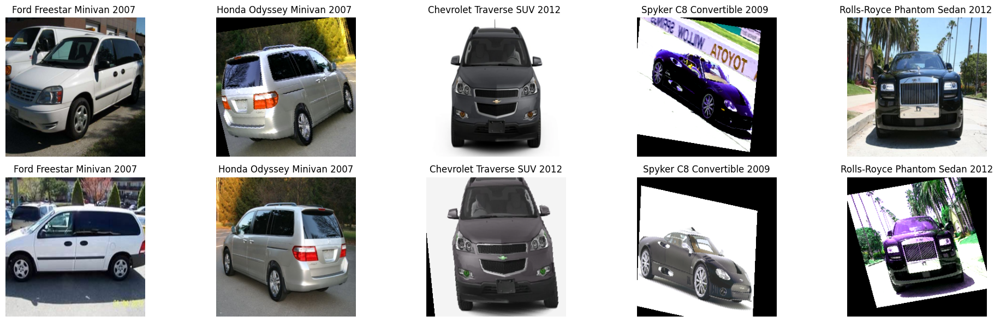

In [44]:
def show_results_k1(num_images_pairs = 5, errors = False, validation_dataset = validation_dataset,
					train_dataset = upd_train_dataset,
					Indexes = Indexes):
	
	'''
	Функция вывода предсказаний при 1 ближайшем соседе

	Параметры:
	-num_images_pairs: количество пар изображений, которые мы хотим получить
	-errors (Bool): флаг показа ошибок (default False)
	-validation_dataset: валидационный датасет
	-train_dataset: тренировочный датасет
	-Indexes: индекс от Faiss
	'''


	fig, axes = plt.subplots(2, num_images_pairs, figsize=(20, 6))
	count = 0
	def plot_val_train_img(i, idx):

		'''
		Объявленная внутренняя функция для отображения

		Параметры:
		-i: индекс в валидационном датасете
		-idx: значения соседа из Indexes
		'''

		val_img = validation_dataset[i][0].detach().clone()
		label = validation_dataset[i][1]
		validation_img = unnormalize(val_img).permute(1, 2, 0).numpy()
		axes[0, count].imshow(validation_img)
		axes[0, count].set_title(f'{id_to_car[label]} ')
		axes[0, count].axis('off')

		train_img = train_dataset[idx][0].detach().clone()
		label = train_dataset[idx][1]
		training_img = unnormalize(train_img).permute(1, 2, 0).numpy()
		axes[1, count].imshow(training_img)
		axes[1, count].set_title(f'{id_to_car[label]}')
		axes[1, count].axis('off')
				
	for i, (image, label) in enumerate(validation_dataset):
		
		idx = Indexes.flatten()[i]
		if not errors:
			if label == train_dataset[idx][1]:
				plot_val_train_img(i , idx)
				count+=1
			if count == num_images_pairs:
				break
		else:
			if label != train_dataset[idx][1]:
				plot_val_train_img(i , idx)
				count+=1
			if count == num_images_pairs:
				break
	
show_results_k1()
				
plt.tight_layout()
plt.show()

#### Визуализируем ошибки модели:

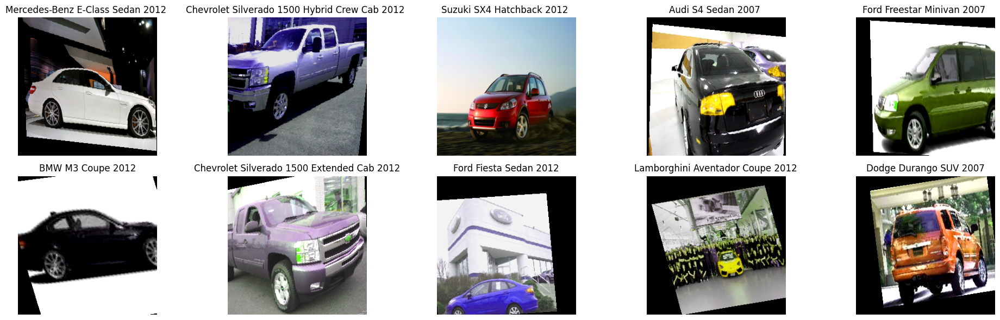

In [45]:
# Блок визуализации ошибок

show_results_k1(errors=True)
                
plt.tight_layout()
plt.show()

#### Для числа соседей k = 5:

In [ ]:
# Faiss для 5 ближайших соседей

Distances5, Indexes5 = index.search(val_emb, 5)

In [47]:
# Подсчет метрик precision@5 и recall@5

correct_matches = (val_labels[:, None] == train_labels[Indexes5])
precision_at_5 = []
recall_at_5 = []
for neighbors in correct_matches:
    precision_at_5.append(np.sum(neighbors) / 5)
    recall_at_5.append(np.sum(neighbors))

print(f'Precision@5: {np.mean(precision_at_5)}')
print(f'Recall@5: {np.mean(recall_at_5)}')


Precision@5: 0.8446899938612645
Recall@5: 4.223449969306323


#### Визуализируем корректные предсказания:

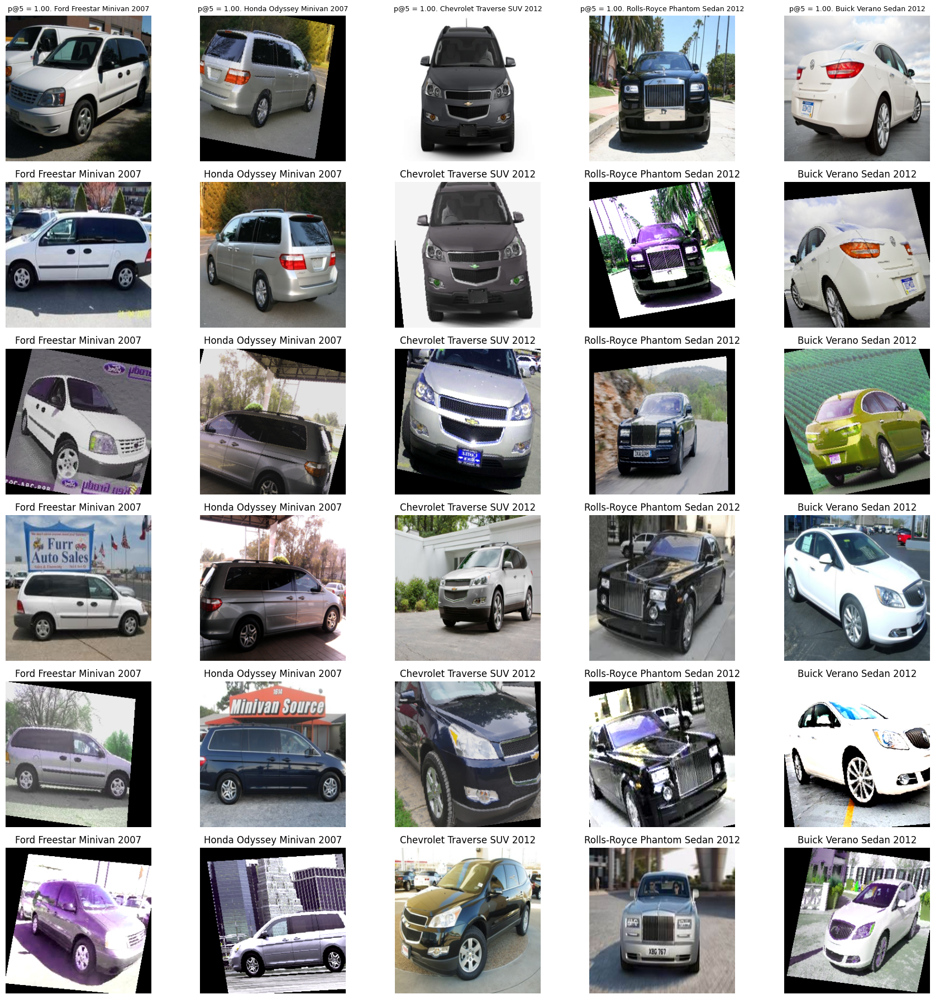

In [48]:
def show_results_k5(num_images_in_series=5, errors=False, validation_dataset=validation_dataset,
					train_dataset=upd_train_dataset, Indexes=Indexes5,
				precision_threshold = 0.75):
	
	'''
	Функция отображения результатов для 5 ближайщих соседей

	Параметры:
	-num_images_pairs: количество пар изображений, которые мы хотим получить
	-errors (Bool): флаг показа ошибок (default False)
	-validation_dataset: валидационный датасет
	-train_dataset: тренировочный датасет
	-Indexes: индекс от Faiss
	-precision_threshold: float (В случае errors = True ошибкой будем считать те случаи,
	когда precison@5 будет ниже данного threshold'а)
	
	'''
	
	fig, axes = plt.subplots(6, 5, figsize=(18, 18)) 
	count = 0

	def plot_val_train_img(i, idxs, precision_at_5):
		
		'''
		Объявленная внутренняя функция для отображения

		Параметры:
		-i: индекс в валидационном датасете
		-idx: значения соседа из Indexes
		-precision_at_5: значение precision@5 для отображения в заголовке

		'''
		
		val_img = validation_dataset[i][0].detach().clone()
		label = validation_dataset[i][1]
		validation_img = unnormalize(val_img).permute(1, 2, 0).numpy()
		
		axes[0, count].imshow(validation_img)
		axes[0, count].set_title(f'p@5 = {precision_at_5:.2f}. {id_to_car[label]}', fontsize=9)
		axes[0, count].axis('off')
		
		for j, idx in enumerate(idxs):
			train_img = train_dataset[idx][0].detach().clone()
			label = train_dataset[idx][1]
			training_img = unnormalize(train_img).permute(1, 2, 0).numpy()
			axes[j+1, count].imshow(training_img)
			axes[j+1, count].set_title(f'{id_to_car[label]}')
			axes[j+1, count].axis('off')
		
	for i, (image, label) in enumerate(validation_dataset):
		idxs = Indexes[i]
		correct_matches = (val_labels[i, None] == train_labels[idxs])
		precision_in_group = np.sum(correct_matches) / 5

		if not errors:
			if precision_in_group > precision_threshold: 
				plot_val_train_img(i, idxs, precision_in_group)
				count += 1
			if count == num_images_in_series:  
				break
		else:
			if precision_in_group < precision_threshold:  
				plot_val_train_img(i, idxs, precision_in_group)
				count += 1
			if count == num_images_in_series: 
				break

show_results_k5()
plt.tight_layout()
plt.show()


#### И ошибки:

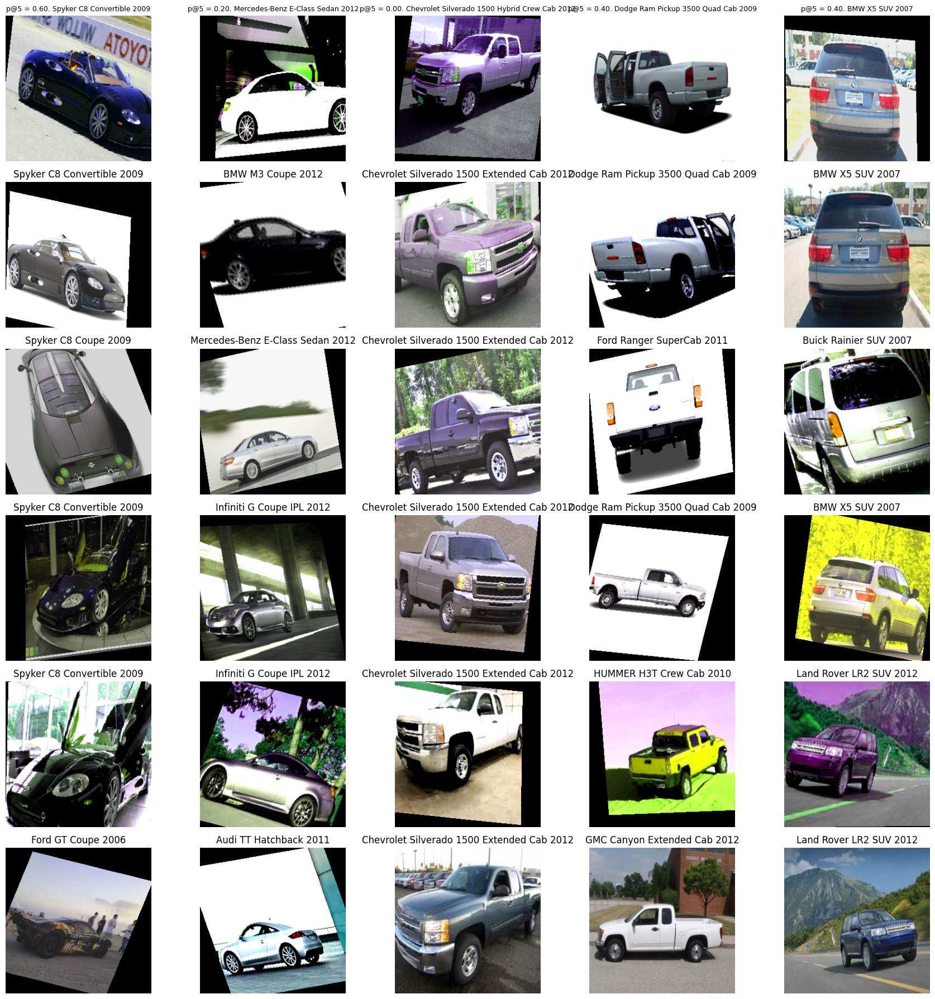

In [49]:
# Блок отображения ошибок

show_results_k5(errors=True)
plt.tight_layout()
plt.show()

#### По метрикам и визуально ArcFace показавыет лучшие результаты поиска:

#### Далее, посмотрим на GradCam интерпретацию:	✅

In [60]:
# Блок инициализации всего необходимого для GradCAM

from PIL import Image
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import requests

In [201]:
transform_to_show = torchvision.transforms.Compose([
						torchvision.transforms.Resize(
							size=(276, 276)
						),
						torchvision.transforms.ToTensor()
						])


def get_image_from_path(path):
	
	'''
	Функция, которая получает путь к файлу изображения и возвращает:

	-np.asarray(orig_im): массив numpy для PIL изображения (исходное изображения)
	-rgb_im: трансформированное изображение для показа (transform_to_show)
	-transformed_im: трансформированное изображение для подачи в сеть (base_transform)
	'''
	
	try:
		orig_im = Image.open(path).convert('RGB')
	except:
		print('Problem loading image')
		
	rgb_im = transform_to_show(orig_im).permute(1, 2, 0)
	transformed_im = base_transform(orig_im).unsqueeze(0).to(device)
	return np.asarray(orig_im), rgb_im, transformed_im


'''Словарь для сохранения float'ов и tensor'ов'''
images_dict = {}
images_dict['floats'] = []
images_dict['tensors'] = []

'''Пути к папкам'''
folder_path = '/kaggle/input/cars-template'
folder_path_2 = '/kaggle/input/cars-2'

files = os.listdir(folder_path)
files_2 = os.listdir(folder_path_2)

'''Логика заполнения словарей через экспериментальные файлы скачанных из интернета автомобилей'''
for file in files:
	file_path = os.path.join(folder_path, file)
	if os.path.isfile(file_path):
		print(os.path.abspath(file_path))
		orig_im, rgb_im, transformed_im = get_image_from_path(os.path.abspath(file_path))
		images_dict['floats'].append(rgb_im)
		images_dict['tensors'].append(transformed_im)

for file in files_2:
	file_path = os.path.join(folder_path_2, file)
	if os.path.isfile(file_path):
		print(os.path.abspath(file_path))
		orig_im, rgb_im, transformed_im = get_image_from_path(os.path.abspath(file_path))
		images_dict['floats'].append(rgb_im)
		images_dict['tensors'].append(transformed_im)


/kaggle/input/cars-template/istockphoto-1427690137-612x612.jpg
/kaggle/input/cars-template/jdnbychbc1u61.jpg
/kaggle/input/cars-template/P90270128_highRes_phantom-vii-900x563.jpg
/kaggle/input/cars-2/ram-1500-laramie-longhorn-5_VG2712439_MG7035661.jpg
/kaggle/input/cars-2/scale_1200.jpg
/kaggle/input/cars-2/chevrolet_silverado-1_slide_big.jpg


In [202]:
class SimilarityToConceptTarget:
    def __init__(self, features):
        self.features = features
    
    def __call__(self, model_output):
        cos = torch.nn.CosineSimilarity(dim=0)
        return cos(model_output, self.features)


In [203]:
# Слой по которому будем делать GradCAM

model_best_loss_arcface.backbone.layer4[-1]

BasicBlock(
  (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

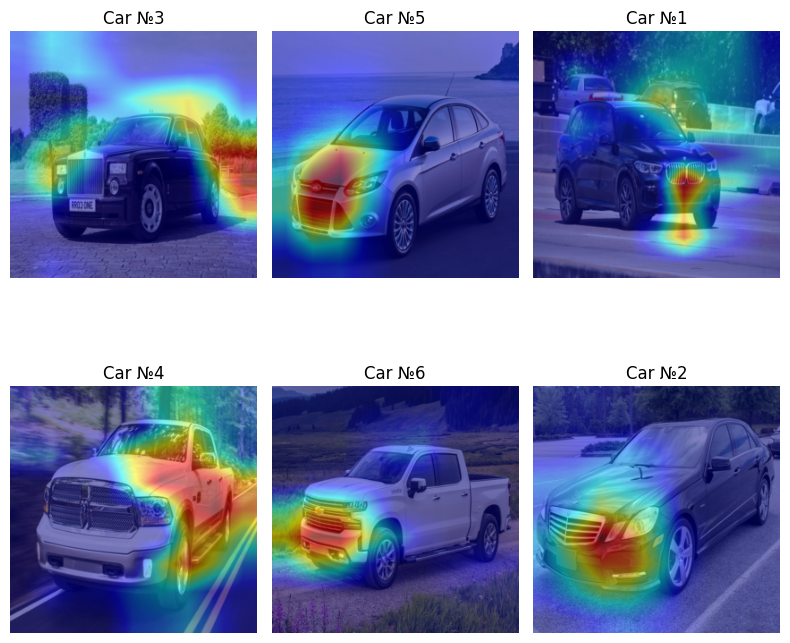

In [213]:
# Получаем данные и реализуем GradCAM из коробки

def get_data(car_tensor):
    target_layers = [model_best_loss_arcface.backbone.layer4[-1]]
    car_concept_features = model_best_loss_arcface(car_tensor)[0, :]
    car_targets = [SimilarityToConceptTarget(car_concept_features)]
    return target_layers, car_concept_features, car_targets

fig, axes = plt.subplots(2, 3, figsize = (8, 8))
for i, (car_rgb, car_tensor) in enumerate(zip(images_dict['floats'], images_dict['tensors'])):
    target_layers, car_concept_features, car_targets = get_data(car_tensor)
    with GradCAM(model=model_best_loss_arcface.backbone, target_layers=target_layers) as cam:
        car_grayscale_cam = cam(input_tensor=car_tensor, targets=car_targets)[0, :]
    car_cam_image = show_cam_on_image(car_rgb.numpy(), car_grayscale_cam, use_rgb=True)
    axes[(i % 2), (i // 2) - 1].imshow(car_cam_image)
    axes[(i % 2), (i // 2) - 1].set_title(f'Car №{i+1}')
    axes[(i % 2), (i // 2) - 1].axis('off')  
    
plt.tight_layout()
plt.show()